## Configure

In [1]:
import pandas as pd
import seaborn as sns
from matplotlib.font_manager import FontProperties
import matplotlib.pyplot as plt
import re
import os
import tqdm
# plt.style.use('fivethirtyeight')
myfont=FontProperties(fname='simhei.ttf',size=14)
sns.set(font=myfont.get_name())

import matplotlib.pyplot as plt
# 指定默认字体
plt.rcParams['font.sans-serif']=['SimHei'] 
plt.rcParams['font.family']='sans-serif' 
# 用来正常显示负号
plt.rcParams['axes.unicode_minus']=False


/Users/tawn/.pyenv/versions/3.6.8/lib/python3.6/site-packages/pandas/compat/__init__.py:117: UserWarning: Could not import the lzma module. Your installed Python is incomplete. Attempting to use lzma compression will result in a RuntimeError.
  warnings.warn(msg)


## Load data

In [2]:
file_list = os.listdir('../house_clean/shanghai.house.csv')
file = ''
for i in file_list:
    if os.path.splitext(i)[1] == '.csv':
        file = i
        break

In [3]:
df = pd.DataFrame(pd.read_csv('../house_clean/shanghai.house.csv/' + file, header=0))
df.dtypes

raw_key           object
price              int64
pay_way            int64
tag               object
rent_way          object
house_type        object
size             float64
orientation        int64
floor             object
decorate_type      int64
facility          object
traffic            int64
address            int64
coordinate        object
dtype: object

## Preprocess

In [4]:
pay_way_list = ['未知', '面议', '押一付一', '押一付二', '押一付三', '押一付半年', '押一付一年', '押二付一', '押二付二', '押二付三', '押三付一', '押三付三', '半年付', '年付']
orientation_list = ['未知', '东', '南', '西', '北', '东南', '东北', '西南', '西北', '东西', '南北']
decorate_type_list = ['未知', '毛坯', '简单装修', '中等装修', '精装修', '豪华装修']
address_list = ['未知', '黄浦', '嘉定', '普陀', '上海周边', '浦东', '徐汇', '静安', '松江', '青浦', '杨浦', '虹口', '崇明', '奉贤', '长宁', '金山', '宝山', '闵行']


df['pay_way'] = df['pay_way'].apply(lambda x: pay_way_list[x])
df['orientation'] = df['orientation'].apply(lambda x: orientation_list[x])
df['decorate_type'] = df['decorate_type'].apply(lambda x: decorate_type_list[x])
df['address'] = df['address'].apply(lambda x: address_list[x])


In [5]:
df_price_0 = df[df.price<=10000]
df_price_1 = df[df.price>10000]
df_price_1 = df_price_1[df_price_1.price<=100000]
df_price_2 = df[df.price>100000]

df_size_0 = df[df['size']<=200]
df_size_1 = df[df['size']>200]
df_size_1 = df_size_1[df_size_1['size']<=1000]
df_size_2 = df[df['size']>1000]

df_traffic = df[df['traffic'] != 3000]

In [6]:
floor_level_list = ['未知', '高层', '中层', '低层', '地下']
df_floor = df
df_floor['floor_level'] = df_floor['floor'].apply(lambda x: floor_level_list[int(x[4])])
df_floor = df_floor[df_floor['floor_level'] != '未知']
# print(df_floor['floor_level'].head(10))

In [7]:
df_house_type = df
df_house_type['room'] = df_house_type['house_type'].apply(lambda x: x[1] + '-' + x[4] + '-' + x[7])
df_house_type['room'] = df_house_type[df_house_type['room'] != '0-0-0']

## Analyssis

In [8]:
#绘制房价分布图
# plt.rcParams['font.sans-serif'] = ['SimHei']
plt.rc('font',family=['Arial Unicode MS'])
# plt.rcParams['font.sans-serif']=['SimHei'] #显示中文标签
# plt.rcParams['font.serif'] = ['KaiTi']
# plt.rcParams['axes.unicode_minus'] = False

plt.figure(figsize=(12, 8), dpi=512)
sns.distplot(df['price'], kde_kws={"color": "coral", "lw": 1, "label": "whole"},
            hist_kws={"histtype" : "stepfilled", "linewidth": 3, "alpha": 1, "color": "skyblue"})
plt.title(u'房价分布直方图', fontsize=15)
plt.savefig('result/房价分布直方图_1.png')

plt.figure(figsize=(12, 8), dpi=512)
sns.distplot(df_price_0['price'], kde_kws={"color": "coral", "lw": 1, "label": "0-10000"},
            hist_kws={"histtype" : "stepfilled", "linewidth": 3, "alpha": 1, "color": "skyblue"})
plt.title(u'房价分布直方图（10000以下）', fontsize=15)
plt.savefig('result/房价分布直方图_2.png')

plt.figure(figsize=(12, 8), dpi=512)
sns.distplot(df_price_1['price'], kde_kws={"color": "coral", "lw": 1, "label": "100000-100000"},
            hist_kws={"histtype" : "stepfilled", "linewidth": 3, "alpha": 1, "color": "skyblue"})
plt.title(u'房价分布直方图（10000-100000）', fontsize=15)
plt.savefig('result/房价分布直方图_3.png')

plt.figure(figsize=(12, 8), dpi=512)
sns.distplot(df_price_2['price'], kde_kws={"color": "coral", "lw": 1, "label": "100000-"},
            hist_kws={"histtype" : "stepfilled", "linewidth": 3, "alpha": 1, "color": "skyblue"})
plt.title(u'房价分布直方图（100000以上）', fontsize=15)
plt.savefig('result/房价分布直方图_4.png')

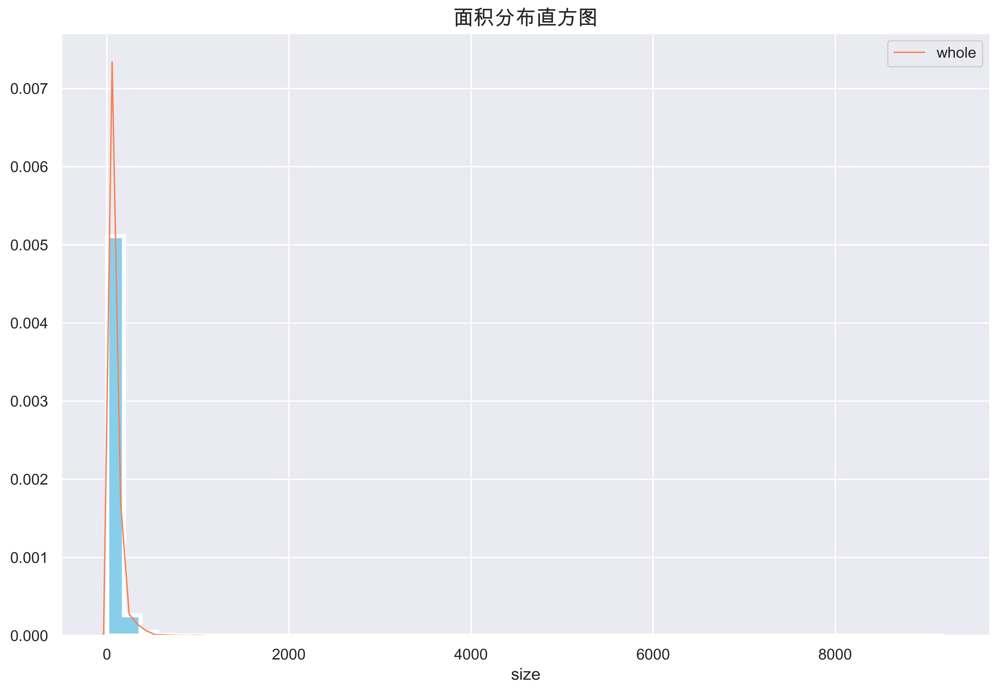

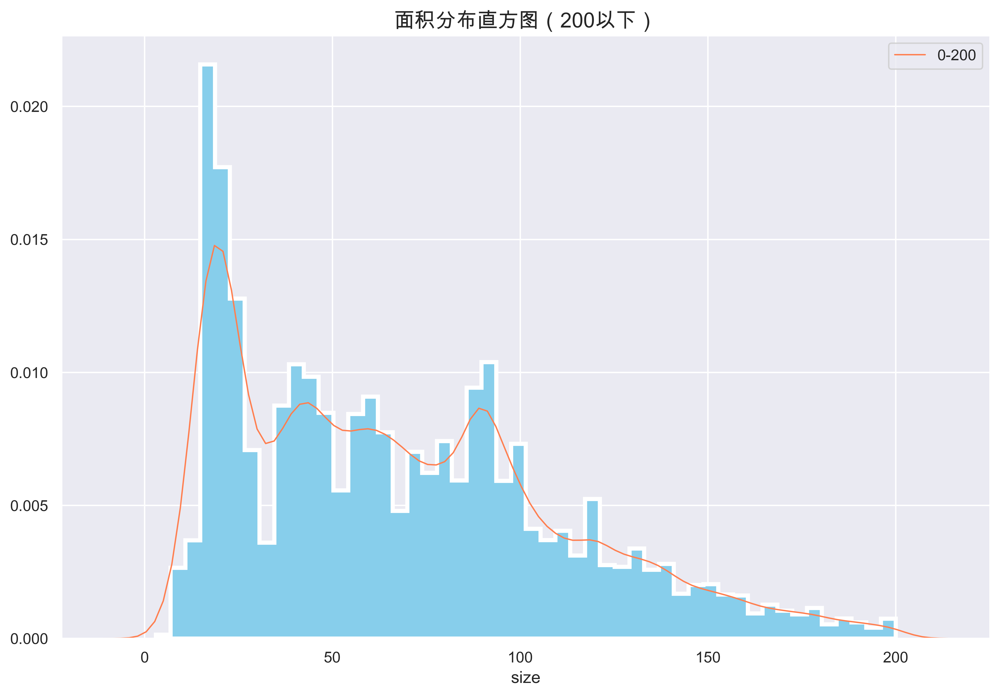

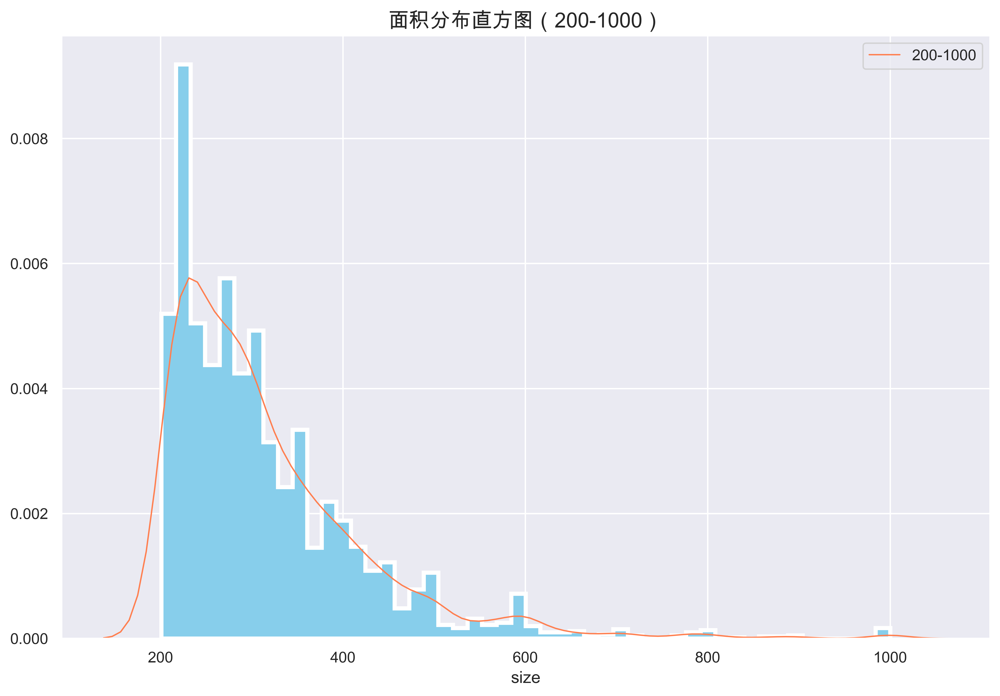

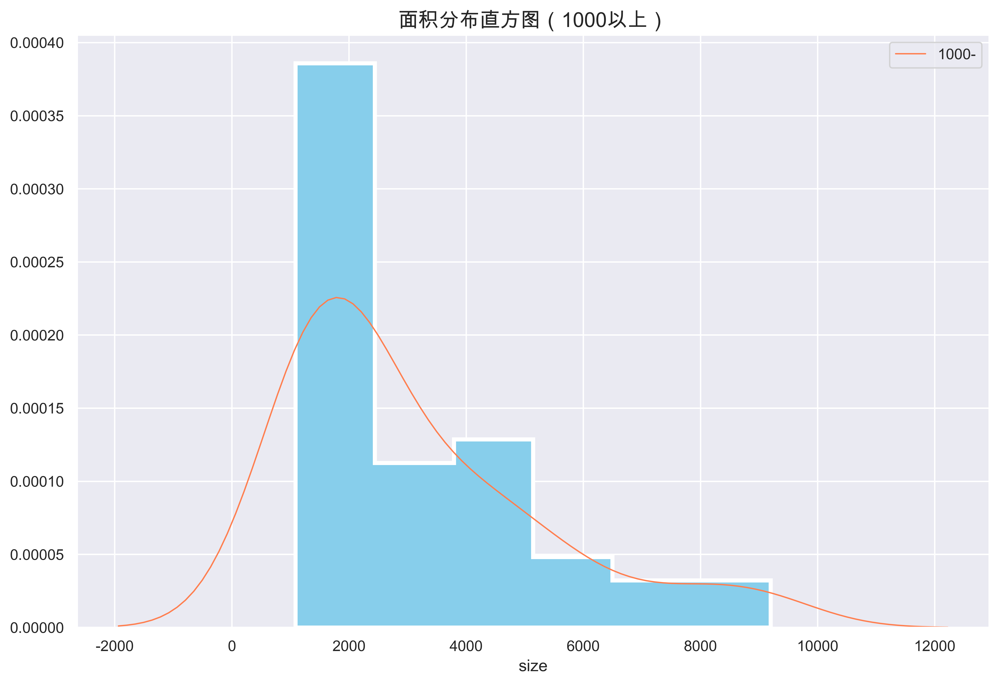

In [298]:
#绘制面积分布图
plt.figure(figsize=(12, 8), dpi=512)
sns.distplot(df['size'], kde_kws={"color": "coral", "lw": 1, "label": "whole"},
            hist_kws={"histtype" : "stepfilled", "linewidth": 3, "alpha": 1, "color": "skyblue"})
plt.title(u'面积分布直方图', fontsize=15)
plt.savefig('result/面积分布直方图_1.png')

plt.figure(figsize=(12, 8), dpi=512)
sns.distplot(df_size_0['size'], kde_kws={"color": "coral", "lw": 1, "label": "0-200"},
            hist_kws={"histtype" : "stepfilled", "linewidth": 3, "alpha": 1, "color": "skyblue"})
plt.title(u'面积分布直方图（200以下）', fontsize=15)
plt.savefig('result/面积分布直方图_2.png')

plt.figure(figsize=(12, 8), dpi=512)
sns.distplot(df_size_1['size'], kde_kws={"color": "coral", "lw": 1, "label": "200-1000"},
            hist_kws={"histtype" : "stepfilled", "linewidth": 3, "alpha": 1, "color": "skyblue"})
plt.title(u'面积分布直方图（200-1000）', fontsize=15)
plt.savefig('result/面积分布直方图_3.png')

plt.figure(figsize=(12, 8), dpi=512)
sns.distplot(df_size_2['size'], kde_kws={"color": "coral", "lw": 1, "label": "1000-"},
            hist_kws={"histtype" : "stepfilled", "linewidth": 3, "alpha": 1, "color": "skyblue"})
plt.title(u'面积分布直方图（1000以上）', fontsize=15)
plt.savefig('result/面积分布直方图_4.png')



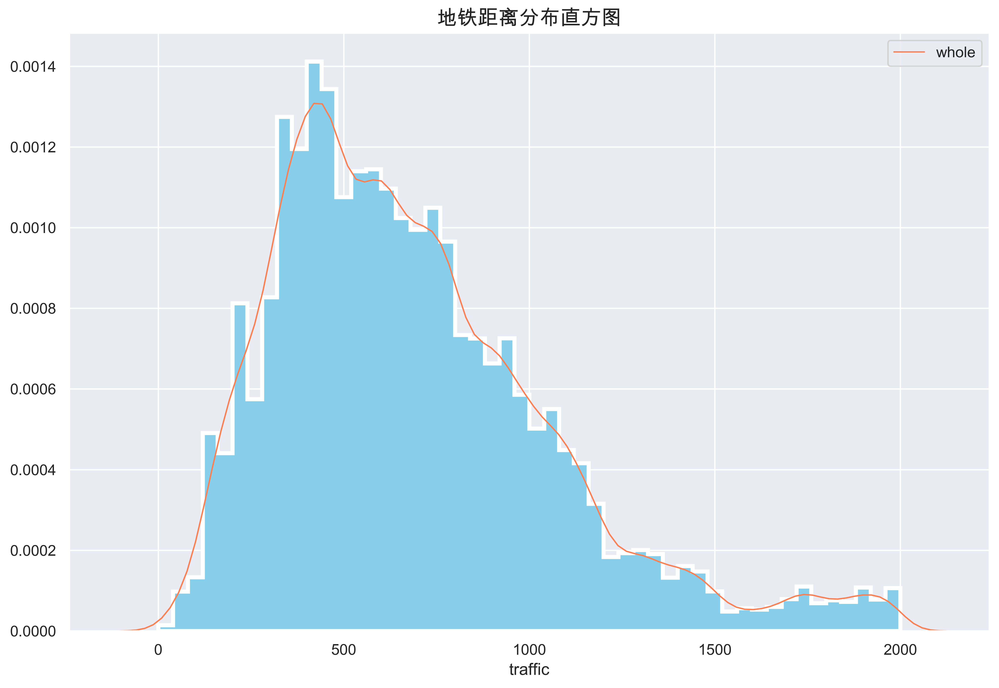

In [299]:
#绘制地铁距离分布图
plt.figure(figsize=(12, 8), dpi=512)
sns.distplot(df_traffic['traffic'], kde_kws={"color": "coral", "lw": 1, "label": "whole"},
            hist_kws={"histtype" : "stepfilled", "linewidth": 3, "alpha": 1, "color": "skyblue"})
plt.title(u'地铁距离分布直方图', fontsize=15)
plt.savefig('result/地铁距离分布直方图_1.png')

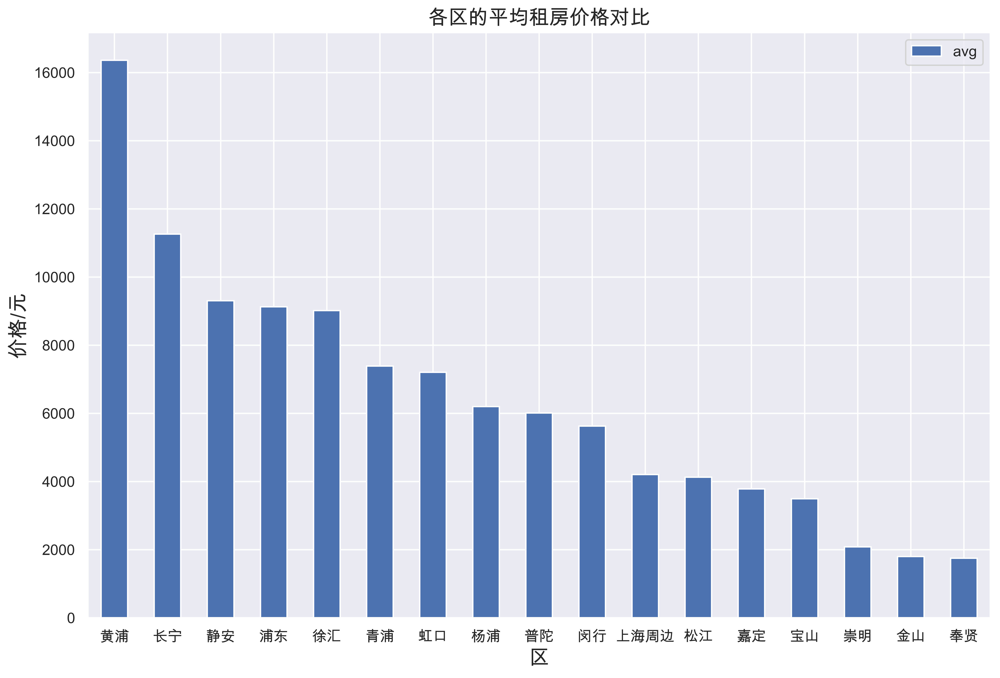

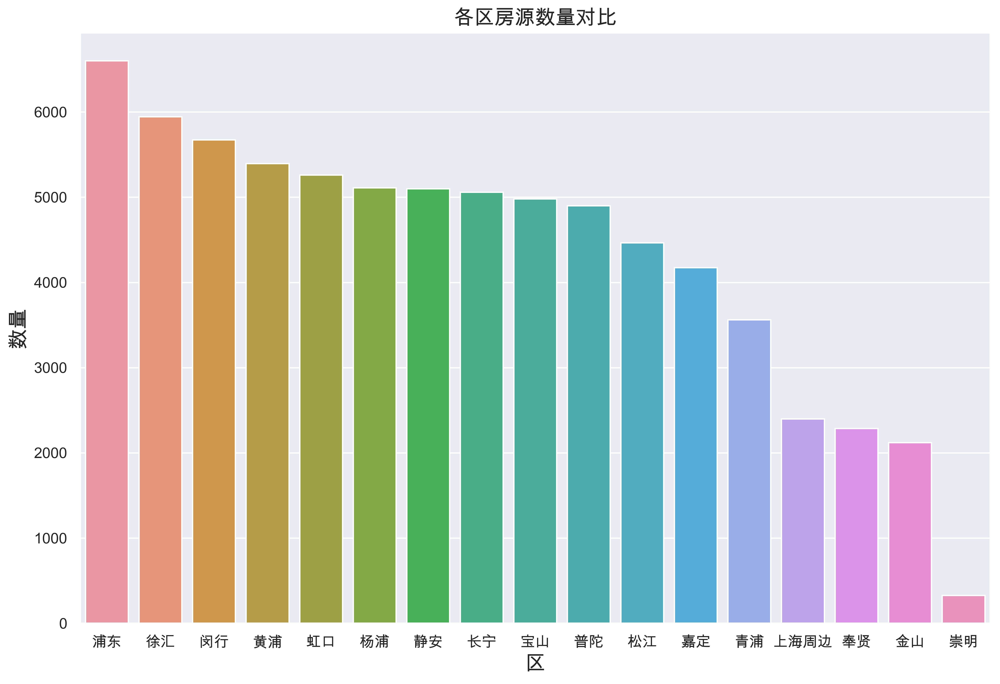

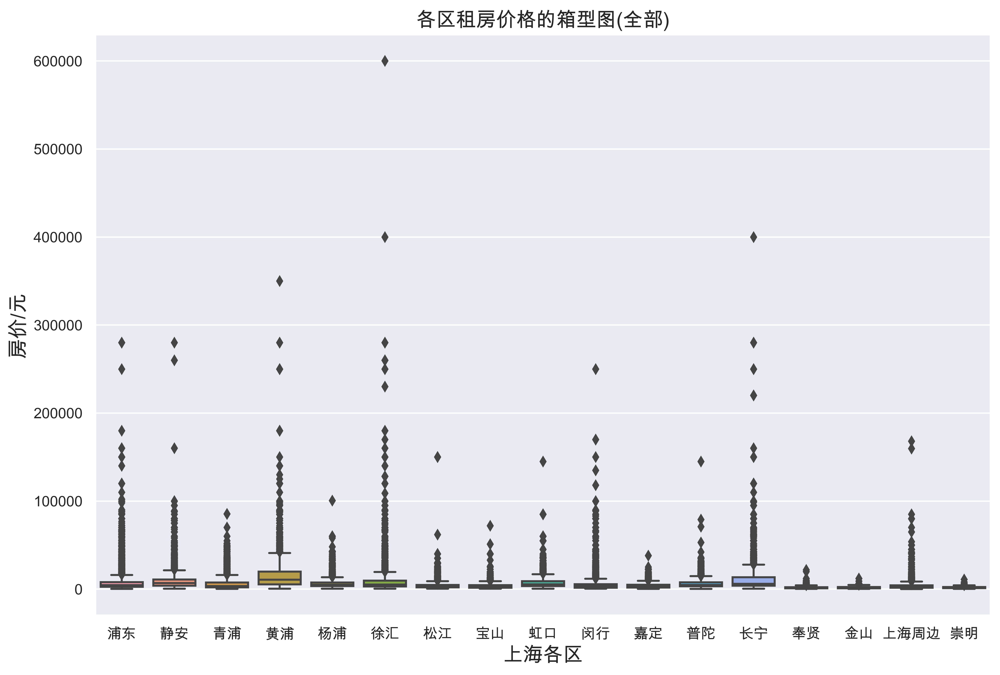

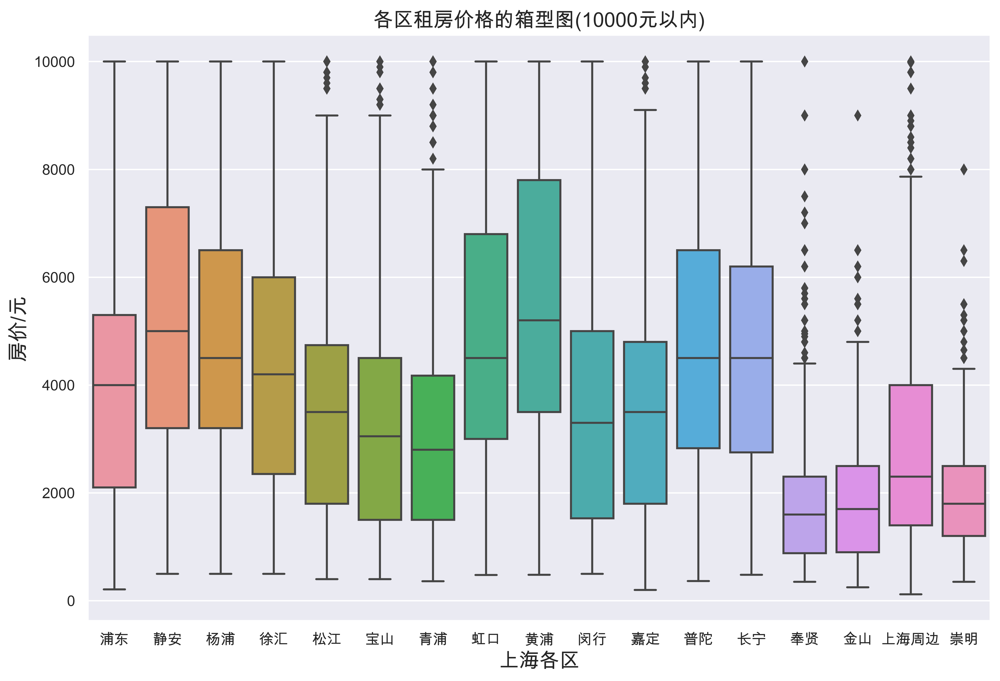

In [300]:
#各个区租房价格均价、最大值、房源数量等对比情况
plt.figure(figsize=(12, 8), dpi=512)
df_house_mean = df.groupby('address')['price'].mean().sort_values(ascending=False).plot(kind='bar', label="avg")
# df_house_max = df.groupby('address')['price'].max().sort_values(ascending=False).plot(kind='line', label="max")
plt.title("各区的平均租房价格对比", fontsize=15)
plt.xlabel("区", fontsize=15)
plt.ylabel("价格/元", fontsize=15)
plt.xticks(rotation=0)
plt.legend(loc=0)
plt.savefig('result/各区的平均租房价格对比.png')
plt.show()

plt.figure(figsize=(12, 8), dpi=512)
tmp=df['address'].value_counts()
ax = sns.countplot(df['address'], order=tmp.index)
ax.set_title('各区房源数量对比', fontsize=15)
ax.set_xlabel('区', fontsize=15)
ax.set_ylabel('数量', fontsize=15)
plt.savefig('result/各区房源数量对比.png')
plt.show()

#绘制上海各区的房价箱格图
plt.figure(figsize=(12,8), dpi=512)
ax = sns.boxplot(x="address", y="price",data=df[['address','price']]) 
ax.set_title('各区租房价格的箱型图(全部)', fontsize=15)
ax.set_xlabel("上海各区", fontsize=15) 
ax.set_ylabel("房价/元", fontsize=15) 
plt.savefig('result/各区租房价格的箱型图(全部).png')
plt.show()

#绘制上海各区价格在0-10000的房价箱格图
plt.figure(figsize=(12,8), dpi=512)
ax = sns.boxplot(x="address", y="price",data=df_price_0[['address','price']]) 
ax.set_title('各区租房价格的箱型图(10000元以内)', fontsize=15)
ax.set_xlabel("上海各区", fontsize=15) 
ax.set_ylabel("房价/元", fontsize=15) 
plt.savefig('result/各区租房价格的箱型图(10000元以内).png')
plt.show()

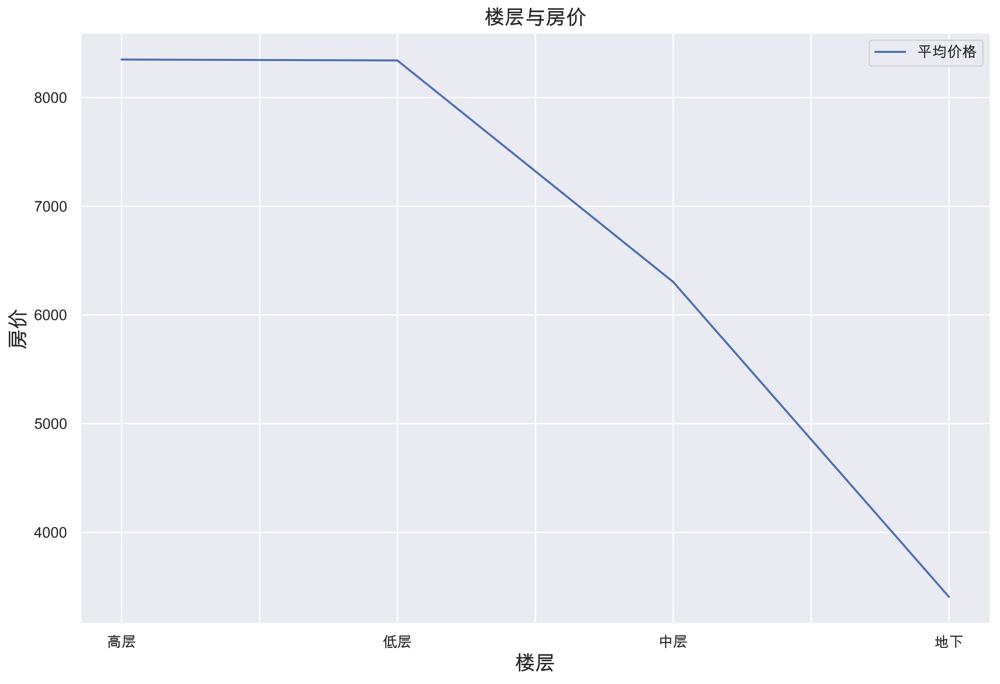

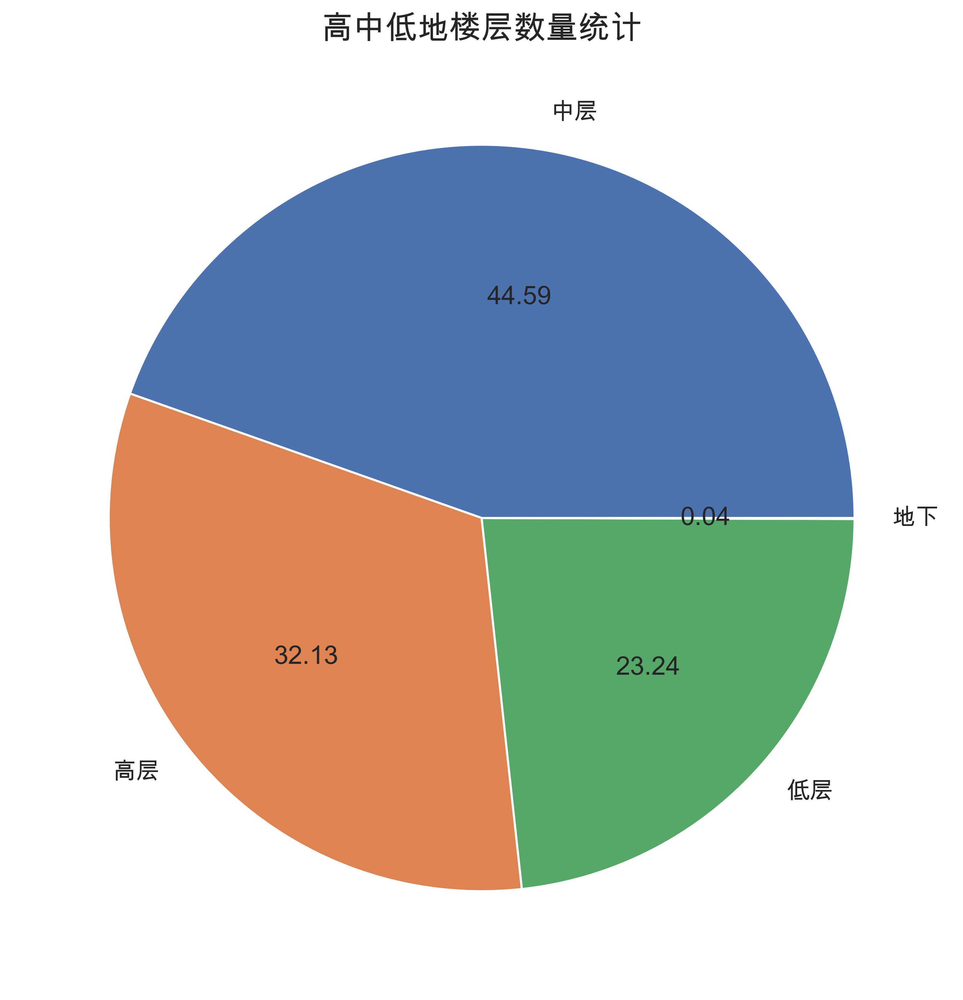

In [301]:
#房价与楼层
plt.figure(figsize=(12, 8), dpi=512)
df_house_mean = df_floor.groupby('floor_level')['price'].mean().sort_values(ascending=False).plot(kind='line', label="平均价格")
# df_house_max = df_floor.groupby('floor_level')['price'].max().sort_values(ascending=False).plot(kind='line', label="最大价格")
plt.title('楼层与房价', fontsize=15)
plt.xlabel("楼层", fontsize=15)
plt.ylabel("房价", fontsize=15)
plt.legend(loc=0)
plt.savefig('result/楼层与房价.png')
plt.show()
#与常识相符合，居中的楼层房价较高，其次是高楼层和低楼层，最后是地下室

#高中低地楼层数量统计
plt.figure(figsize=(12, 8), dpi=512)
plt.pie(df_floor['floor_level'].value_counts(), labels=df_floor['floor_level'].value_counts().index, autopct='%1.2f')
plt.title('高中低地楼层数量统计', fontsize=15)
plt.savefig('result/高中低地楼层数量统计.png')
# plt.figure(figsize=(12, 8))
# plt.pie(df_floor['floor_level'].value_counts(), labels=df_floor['floor_level'].value_counts().index, autopct='%1.1f')
plt.show()

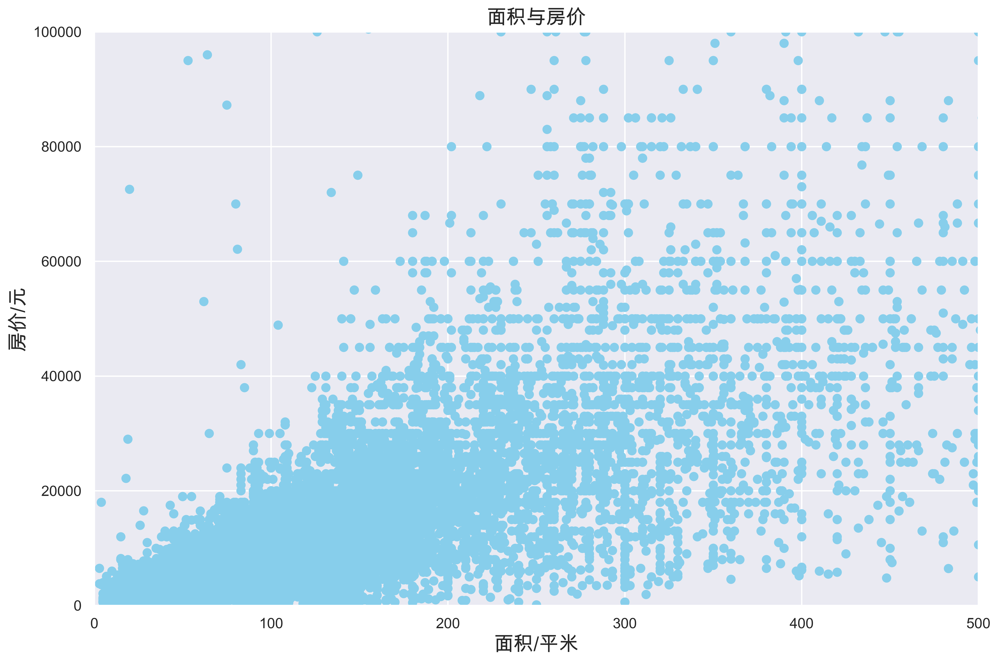

In [302]:
#房价和住房面积间的联系
fig, ax = plt.subplots(figsize=(12, 8), dpi=512)
ax.scatter(x = df['size'], y = df['price'], c = 'skyblue')
plt.ylabel('房价/元', fontsize=15)
plt.xlabel('面积/平米', fontsize=15)
plt.title('面积与房价', fontsize=15)
plt.xlim(0,500)
plt.ylim(0,100000)
plt.savefig('result/面积与房价.png')
plt.show()


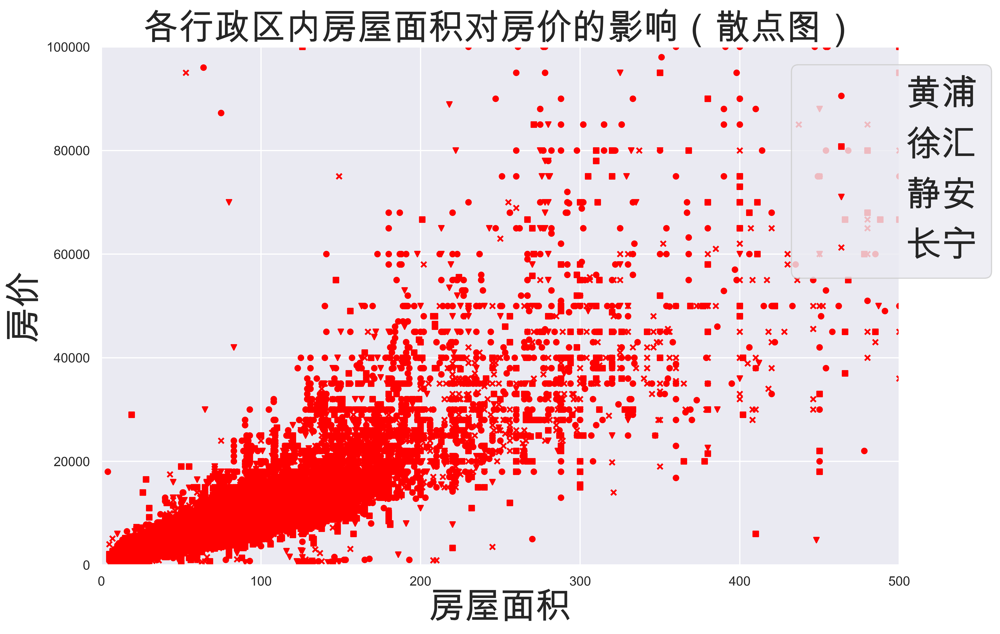

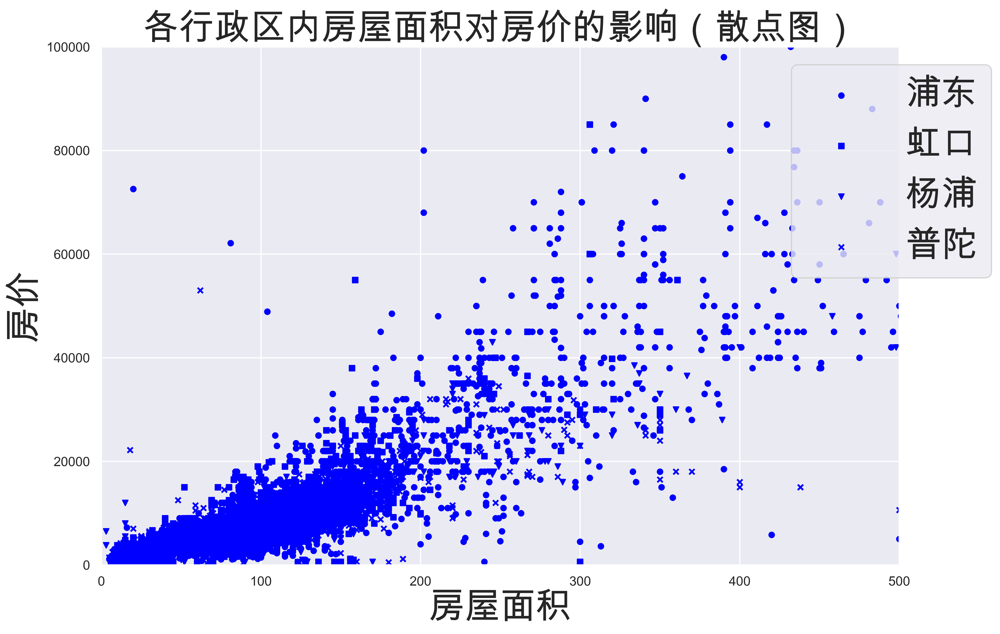

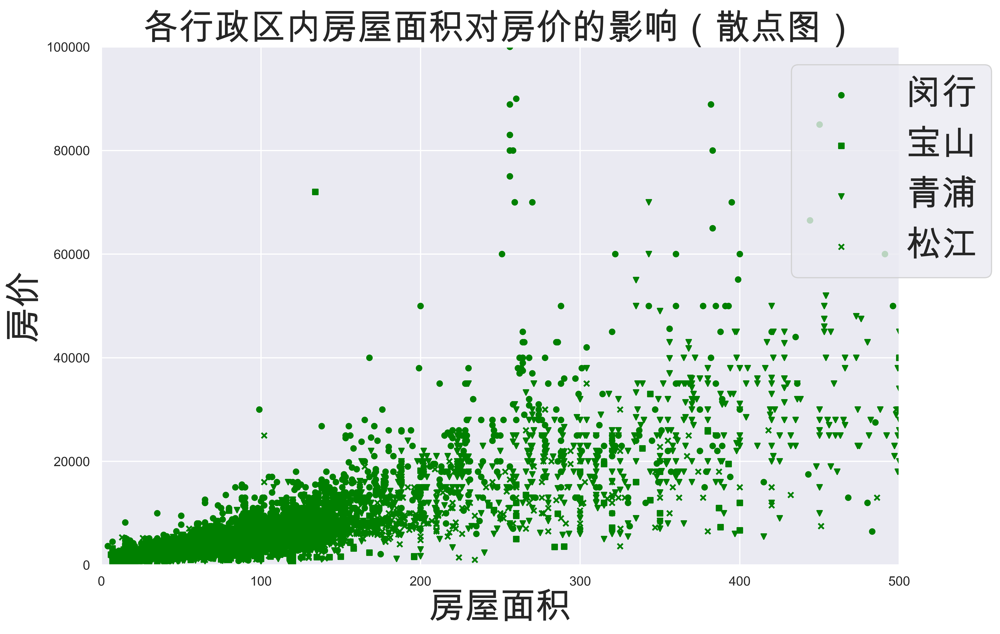

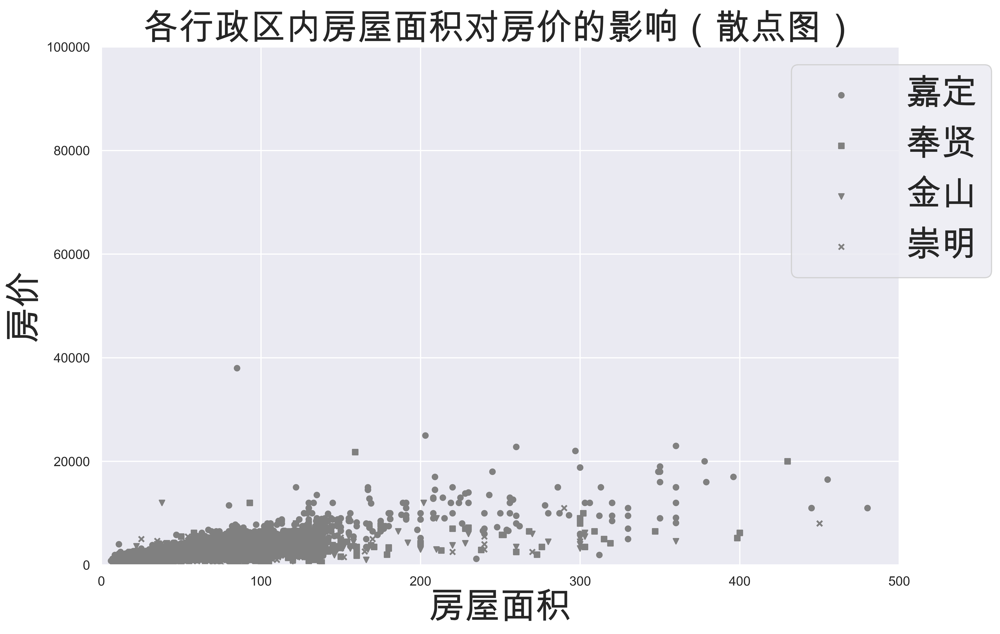

In [12]:
#分区考虑房价和住房面积
def plot_scatter():
#     plt.figure(figsize=(10,8), dpi=512)
    colors = ['red', 'red', 'red', 'red',
              'blue', 'blue', 'blue', 'blue',
              'green', 'green', 'green', 'green',
              'gray', 'gray', 'gray', 'gray']
    district = ['黄浦','徐汇','静安','长宁',
                '浦东', '虹口', '杨浦', '普陀',
                '闵行', '宝山', '青浦', '松江',
                '嘉定', '奉贤', '金山', '崇明']
    markers = ['o', 's', 'v', 'x',
               'o', 's', 'v', 'x',
               'o', 's', 'v', 'x',
               'o', 's', 'v', 'x']
#     print(district)
    for j in range(4):
        plt.figure(figsize=(12,8), dpi=512)
        for i in range(4 * j, 4 * (j + 1)):
            x = df.loc[df['address'] == district[i]]['size']
            y = df.loc[df['address'] == district[i]]['price']
            plt.scatter(x, y, c=colors[i], s=20, label=district[i], marker=markers[i])

        plt.legend(loc=1,bbox_to_anchor=(1.138,1.0),fontsize=30)
        plt.xlim(0,500)
        plt.ylim(0,100000)
        plt.title('各行政区内房屋面积对房价的影响（散点图）',fontsize=30)
        plt.xlabel('房屋面积',fontsize=30)
        plt.ylabel('房价',fontsize=30)
        plt.savefig('result/各行政区内房屋面积对房价的影响（散点图）_%s.png' % (j+1))
        plt.show()
        
plot_scatter()
# print(df['region'].value_counts())

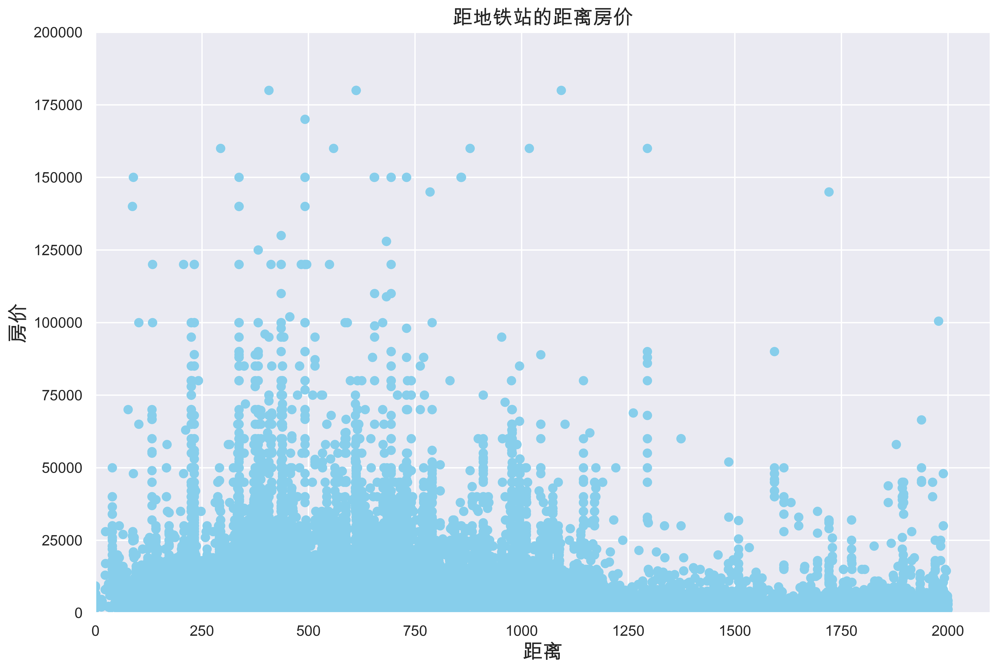

In [304]:
#房价与距地铁站的距离间的关系
fig, ax = plt.subplots(figsize=(12, 8), dpi=512)
ax.scatter(x = df['traffic'], y = df['price'], c = 'skyblue')
plt.ylabel('房价', fontsize=15)
plt.xlabel('距离', fontsize=15)
plt.title('距地铁站的距离房价', fontsize=15)
plt.xlim(0,2100)
plt.ylim(0,200000)
plt.savefig('result/距地铁站的距离与房价.png')
plt.show()

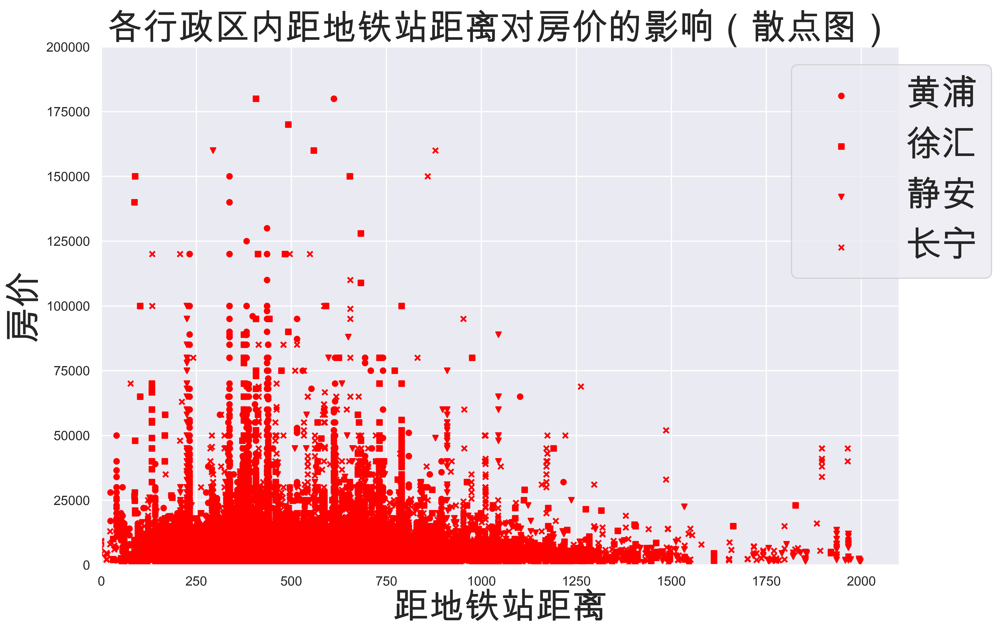

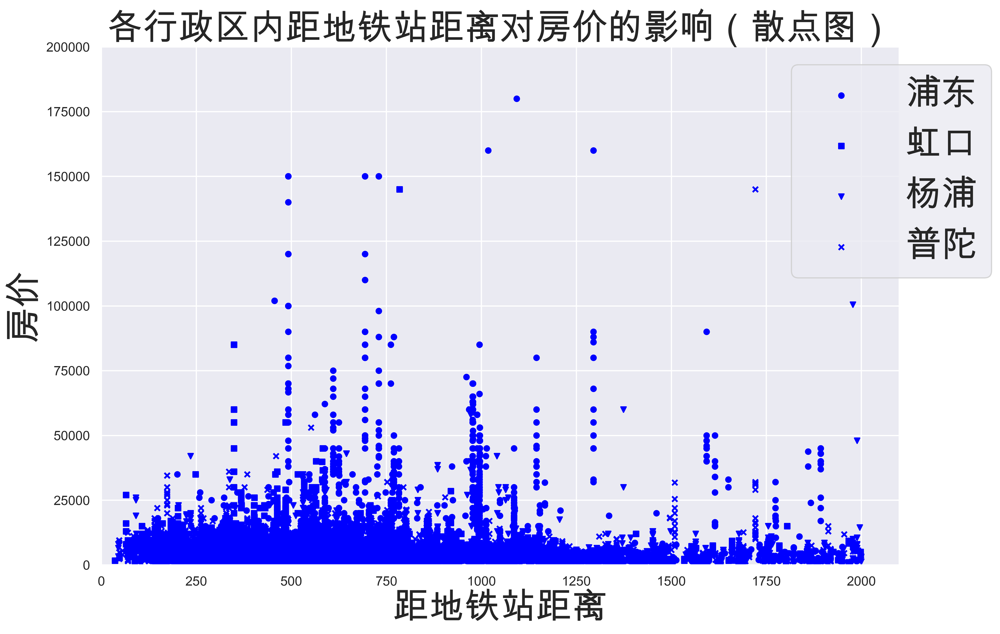

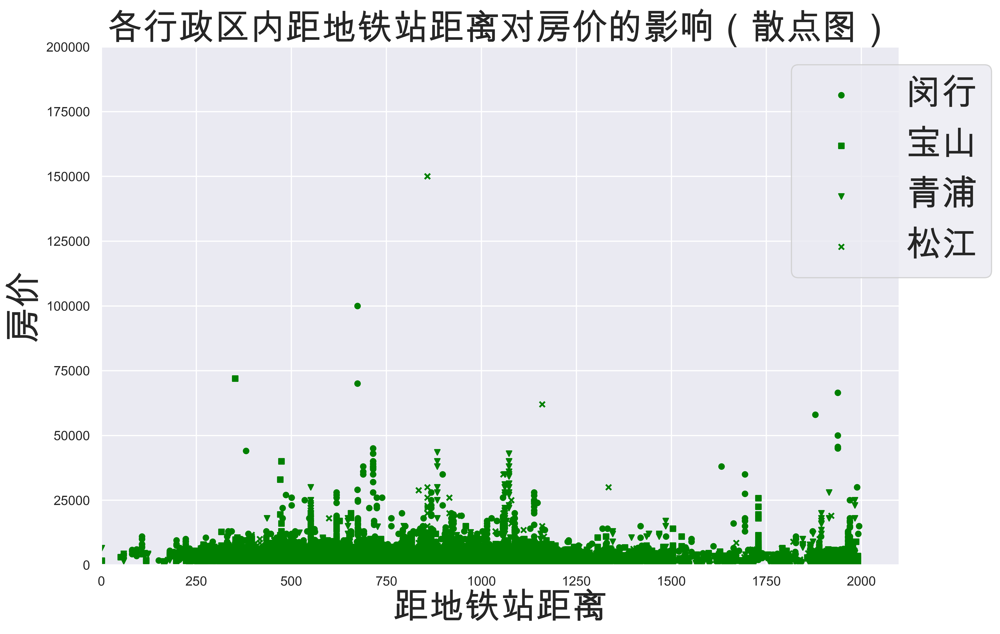

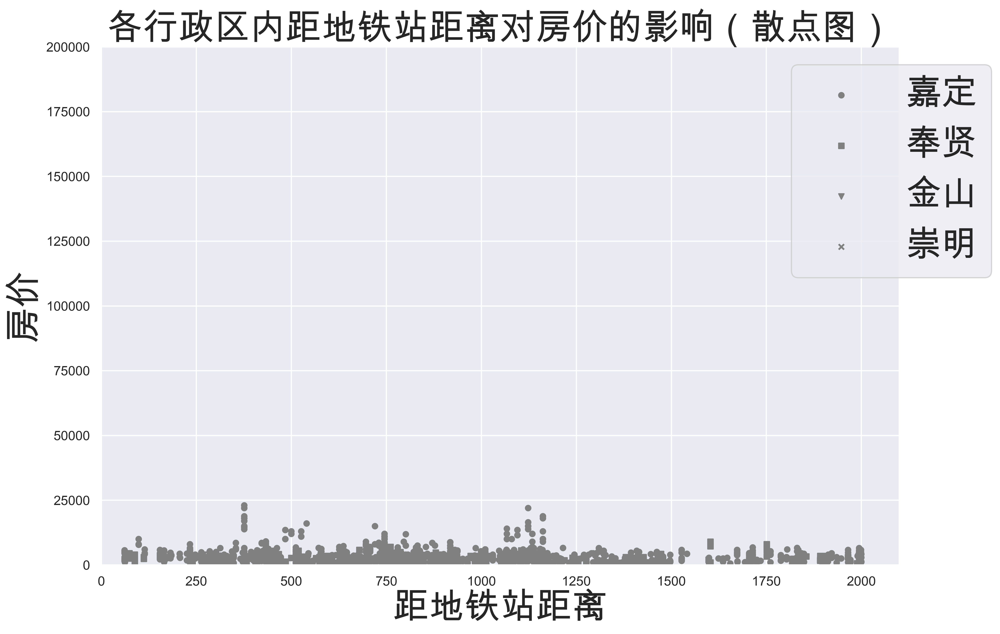

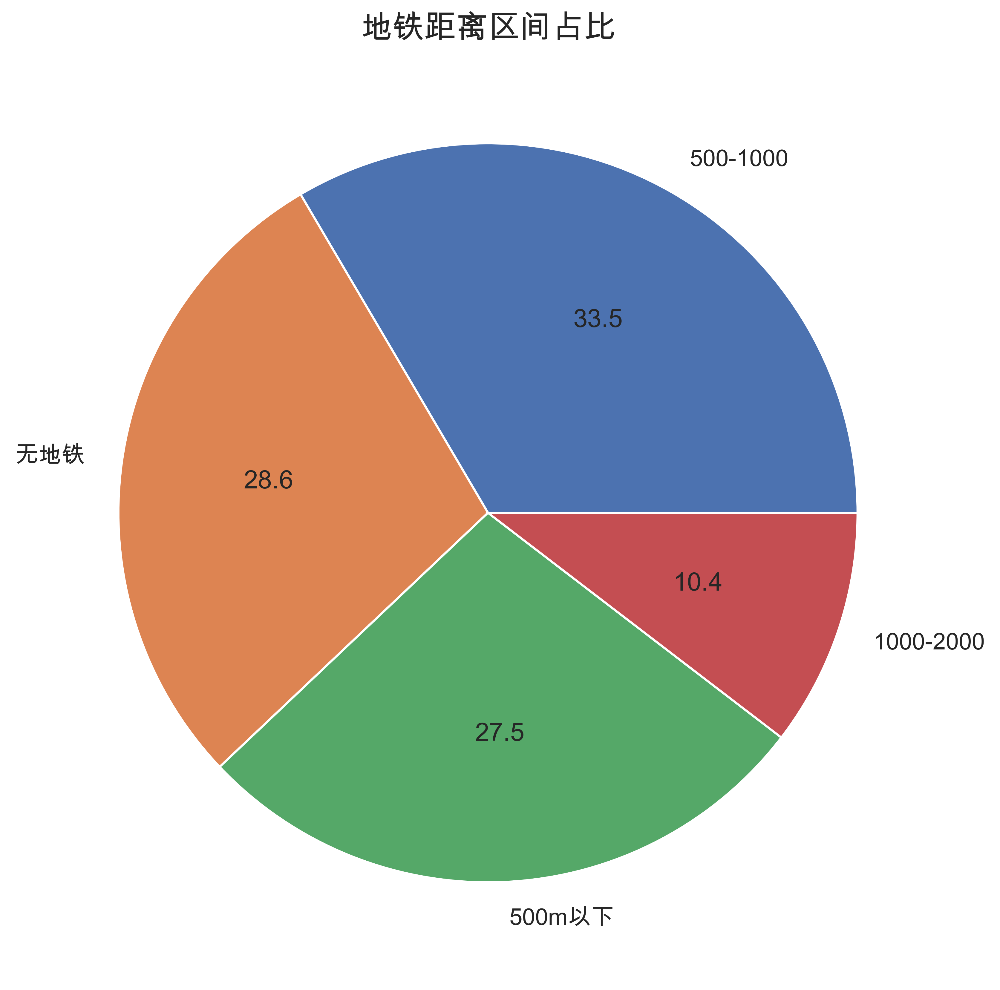

In [14]:
#房价与离地铁站的距离间的关系

def plot_scatter():
#     plt.figure(figsize=(12,8),dpi=512)
    colors = ['red', 'red', 'red', 'red',
              'blue', 'blue', 'blue', 'blue',
              'green', 'green', 'green', 'green',
              'gray', 'gray', 'gray', 'gray']
    district = ['黄浦','徐汇','静安','长宁',
                '浦东', '虹口', '杨浦', '普陀',
                '闵行', '宝山', '青浦', '松江',
                '嘉定', '奉贤', '金山', '崇明']
    markers = ['o', 's', 'v', 'x',
               'o', 's', 'v', 'x',
               'o', 's', 'v', 'x',
               'o', 's', 'v', 'x']
#     print(district)
    for j in range(4):
        plt.figure(figsize=(12,8), dpi=512)
        for i in range(4 * j, 4 * (j + 1)):
            x = df.loc[df['address'] == district[i]]['traffic']
            y = df.loc[df['address'] == district[i]]['price']
            plt.scatter(x, y, c=colors[i], s=20, label=district[i], marker=markers[i])
        
        plt.legend(loc=1,bbox_to_anchor=(1.138,1.0),fontsize=30)
        plt.xlim(0,2100)
        plt.ylim(0,200000)
        plt.title('各行政区内距地铁站距离对房价的影响（散点图）',fontsize=30)
        plt.xlabel('距地铁站距离',fontsize=30)
        plt.ylabel('房价',fontsize=30)
        plt.savefig('result/各行政区内距地铁站距离对房价的影响（散点图）_%s.png' % (j+1))
        plt.show()
        
plot_scatter()

def cut_to(x):
    if x <= 500:
        return '500m以下'
    elif x <=1000:
        return '500-1000'
    elif x <= 1500:
        return '1000-2000'
    else:
        return '无地铁'
    
df['interval'] = df['traffic'].map(cut_to)
# df_rest['interval'] = df_rest['traffic'].map(cut_to)
plt.figure(figsize=(12,8), dpi=512)
plt.title('地铁距离区间占比', fontsize=15)
plt.pie(df['interval'].value_counts(), labels=df['interval'].value_counts().index, autopct='%1.1f')
plt.savefig('result/地铁距离区间占比.png')
# plt.figure(figsize=(12, 8))
# plt.pie(df_rest['interval'].value_counts(), labels=df_rest['interval'].value_counts().index, autopct='%1.1f')
# plt.show()

In [27]:
from wordcloud import WordCloud
import jieba
# 词频计算
import jieba.analyse as analyse
# from scipy.misc import imread
import os
from os import path
import matplotlib.pyplot as plt
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
tags_list = ['是一家人', '不吸烟', '随时看房', '独卫', '繁华地段', '精装修', '已传房本', '紧邻地铁', '家电齐全', '电梯房', '押一付一', '南北通透', '朝南', '不养宠物', '免中介费', '女生合租', '全装全配', '邻地铁', '公区消毒', '入口检疫', '租户稳定', '首次出租', '独立阳台', '普通装修', '拎包入住', '半年起租', '采光好', '低价出租', '配套齐全', '作息正常', '男生合租', '一年起租']    
facility_list = ['卫生间', '独立卫生间', '冰箱', '宽带', '可做饭', '衣柜', '露台', '阁楼', '暖气', '洗衣机', '游泳池', '车位', '微波炉', '沙发', '床', '阳光房', '空调', '热水器', '电视', '阳台', '电梯']

# mk = imageio.imread("images/chinamap.png")
# w = WordCloud()

# 构建并配置词云对象w，注意要加scale参数，提高清晰度
w = WordCloud(width=1000,
              height=700,
              background_color='white',
              font_path='simhei.ttf',
              collocations=False, #避免重复单词
                #                         mask=mk,
                scale=15)

tag_txt_list = list(df['tag'].apply(lambda x: " ".join([tags_list[i] for i in range(len(tags_list)) if json.loads(x)[i]==1])))

string = " ".join(tag_txt_list)
# 将string变量传入w的generate()方法，给词云输入文字
w.generate(string)
# 将词云图片导出到当前文件夹
w.to_file('result/tag_cloud.png')


w = WordCloud(width=1000,
              height=700,
              background_color='white',
              font_path='simhei.ttf',
              collocations=False, #避免重复单词
                #                         mask=mk,
                scale=15)
facility_txt_list = list(df['facility'].apply(lambda x: " ".join([facility_list[i] for i in range(len(facility_list)) if json.loads(x)[i]==1])))

string = " ".join(facility_txt_list)
# 将string变量传入w的generate()方法，给词云输入文字
w.generate(string)
# 将词云图片导出到当前文件夹
w.to_file('result/facility_cloud.png')
